In [1]:
# # pip install spacy
# !python -m spacy download en_core_web_md

In [2]:
# import below libraries for preprocessing
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import mysql.connector



In [63]:
#import NLP and Machine learning libraries for building a model

import spacy

from sklearn.decomposition import PCA

from sklearn.preprocessing import OrdinalEncoder
from sklearn.model_selection import train_test_split
from sklearn.cluster import KMeans

from sklearn.ensemble import AdaBoostClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.ensemble import ExtraTreesClassifier
from sklearn.ensemble import BaggingClassifier
from sklearn.tree import ExtraTreeClassifier
from sklearn.tree import DecisionTreeClassifier
from xgboost import XGBClassifier
from sklearn.svm import SVC
from sklearn.neighbors import KNeighborsClassifier
from lightgbm import LGBMClassifier
from sklearn.linear_model import RidgeClassifier

from sklearn.model_selection import GridSearchCV

from sklearn.metrics import accuracy_score, roc_auc_score, balanced_accuracy_score, f1_score


In [64]:

import json
import pickle
import warnings
warnings.filterwarnings('ignore')

In [3]:
mysql_host_name = "localhost"
mysql_user_name = "root"
mysql_password = "Prakashk14"
mysql_database_name = 'github'

db = mysql.connector.connect(host = mysql_host_name,
                             user = mysql_user_name,
                             password = mysql_password,
                             database = mysql_database_name)
mycursor = db.cursor(buffered = True)

In [4]:
mycursor.execute("Select * from repositories_details;")
data= mycursor.fetchall()
repo = pd.DataFrame(data, columns=[i[0] for i in mycursor.description])


mycursor.execute("Select * from user_details;")
data= mycursor.fetchall()
user = pd.DataFrame(data, columns=[i[0] for i in mycursor.description])
user

,User_Name,Login,Bio,Joined_At,Email,Location,Company,Following_Count,Followers_Count,Public_Repos,Avatar_url,Profile_url,Languages_Used,Starred_Repo
0,I. RAMAKRISHNA RAJA,1476Ram,"Currently working in Sarathi Electric Co, as a...",2021-11-23,None,TIRUCHIRAPALLI,SARATHI ELECTRIC CO,9,2,10,https://avatars.githubusercontent.com/u/949092...,https://github.com/1476Ram,Jupyter Notebook,ossu/data-science
1,Aadithya jp,aadithyajp,Data Scientist,2022-01-18,None,"Chennai, India",None,20,4,11,https://avatars.githubusercontent.com/u/979593...,https://github.com/aadithyajp,Dockerfile JavaScript HTML Python CSS Jupyter ...,aadithyajp/ML-projects
2,Aathityan K,Aathityan-K,None,2022-06-22,None,Madurai,None,4,0,16,https://avatars.githubusercontent.com/u/107989...,https://github.com/Aathityan-K,Jupyter Notebook Python,dsmentors/Text_PreProcessing dsmentors/Image_p...
3,Abdullah Bakir,AbdullahBakir97,Python Developer\r\n\r\n,2023-03-06,abdullah.bakir.204@gmail.com,Berlin,Mystro,546,109,21,https://avatars.githubusercontent.com/u/127149...,https://github.com/AbdullahBakir97,JavaScript HTML Python CSS,mohamedkamal-17/mohamedkamal-17-Bookmark m-eha...
4,Abdulrahman Khaled,Abdulrahmankhaled11,Data Scientist | Data Analyst | Kaggle Master,2022-06-07,None,Egypt,None,7,22,29,https://avatars.githubusercontent.com/u/107066...,https://github.com/Abdulrahmankhaled11,Jupyter Notebook Python,Abdulrahmankhaled11/My-Certificates Abdulrahma...
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
197,Yousef Mohamed,Yousefuwk20,Studying AI at KFS university\r\n\r\n,2022-08-30,None,Mansoura,None,28,25,8,https://avatars.githubusercontent.com/u/112489...,https://github.com/Yousefuwk20,HTML Jupyter Notebook Python C++ Shell,demotu/BMC harryadel/AI-ML-Driven-Companies-In...
198,Yusuf Cinarci,yusufcinarci,I'm Yusuf Cinarci. I am an Electrical and Elec...,2021-01-06,None,None,None,100,111,10,https://avatars.githubusercontent.com/u/770575...,https://github.com/yusufcinarci,Jupyter Notebook Visual Basic .NET C++ Assembl...,fatihilhan42/Scrape_Discord_Bot fatihilhan42/D...
199,Ziad Bari,zbari023,Python Django Fullstack Developer | \r\n Medi...,2022-12-11,barry450643@gmail.com,"Germany, Bonn",Mystro GmbH | Hochschule Koblenz,596,444,39,https://avatars.githubusercontent.com/u/120318...,https://github.com/zbari023,CSS HTML Jupyter Notebook SCSS JavaScript Python,zbari023/youtube zbari023/Med-Mystro zbari023/...
200,None,zhouyunnudt,None,2016-12-15,None,None,None,18,0,55,https://avatars.githubusercontent.com/u/245901...,https://github.com/zhouyunnudt,C++ PHP RobotFramework Cython HTML SQLPL Starl...,mementum/backtrader HqWu-HITCS/Awesome-Chinese...


In [5]:
repo

,Owner,Repo_Name,Repo_Link,Created_At,Description,Forks_Count,Repo_Fullname,Repo_ID,Language_Used,Last_Modified,Pushed_At,Size,Subscriber,Stargazers,Updated_At,Watchers_Counts,Commits,Is_Fork
0,1476Ram,DATA-SCIENCE-PROJECT,https://github.com/1476Ram/DATA-SCIENCE-PROJEC...,2022-08-12,None,0,1476Ram/DATA-SCIENCE-PROJECT,524205362,Jupyter Notebook,None,2022-08-18,5338,1,0,2022-08-12,0,4,0
1,1476Ram,Errorbar-limit-selection,https://github.com/1476Ram/Errorbar-limit-sele...,2022-03-03,None,0,1476Ram/Errorbar-limit-selection,465855770,Jupyter Notebook,None,2022-03-03,23,1,0,2022-03-03,0,2,0
2,1476Ram,Filled-polygon,https://github.com/1476Ram/Filled-polygon.git,2022-03-03,None,0,1476Ram/Filled-polygon,465860430,Jupyter Notebook,None,2022-03-03,31,1,0,2022-03-03,0,2,0
3,1476Ram,GUVI_TASK_-6,https://github.com/1476Ram/GUVI_TASK_-6.git,2022-06-16,None,0,1476Ram/GUVI_TASK_-6,504105493,Jupyter Notebook,None,2022-06-21,163,1,0,2022-06-21,0,8,0
4,1476Ram,Hatch-filled-histograms,https://github.com/1476Ram/Hatch-filled-histog...,2022-03-03,Matplot histogram,0,1476Ram/Hatch-filled-histograms,465827496,Jupyter Notebook,None,2022-03-03,23,1,0,2022-03-03,0,2,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8104,zhouyunnudt,warp-ctc,https://github.com/zhouyunnudt/warp-ctc.git,2020-03-26,Fast parallel CTC.,0,zhouyunnudt/warp-ctc,250167231,None,None,2019-12-25,328,1,0,2020-03-26,0,90,1
8105,zhouyunnudt,XCD,https://github.com/zhouyunnudt/XCD.git,2021-01-21,Mixture of Cognitive Diagnosis Models,0,zhouyunnudt/XCD,331539581,None,None,2020-11-24,147,1,0,2021-01-21,0,48,1
8106,Zid95,Grand-Hotel-website,https://github.com/Zid95/Grand-Hotel-website.git,2023-03-13,Grand-Hotel-website,0,Zid95/Grand-Hotel-website,613337746,CSS,None,2023-03-14,43622,1,4,2023-11-16,4,17,0
8107,Zid95,Greeny-eccomerce-django,https://github.com/Zid95/Greeny-eccomerce-djan...,2023-01-20,Greeny-django-eccomerce online store using pyt...,2,Zid95/Greeny-eccomerce-django,591495512,Python,None,2023-06-10,49848,2,8,2023-08-07,8,64,0


In [6]:
user.isna().sum()

User_Name           27
Login                0
Bio                 77
Joined_At            0
Email              140
Location            74
Company            133
Following_Count      0
Followers_Count      0
Public_Repos         0
Avatar_url           0
Profile_url          0
Languages_Used       0
Starred_Repo         0
dtype: int64

In [7]:
repo.isna().sum()

Owner                 0
Repo_Name             0
Repo_Link             0
Created_At            0
Description        2259
Forks_Count           0
Repo_Fullname         0
Repo_ID               0
Language_Used      2905
Last_Modified      8109
Pushed_At             0
Size                  0
Subscriber            0
Stargazers            0
Updated_At            0
Watchers_Counts       0
Commits               0
Is_Fork               0
dtype: int64

In [8]:
repo1 = repo.copy()

repo1.drop(index=repo[repo.Language_Used.isna()==True]['Repo_Link'].index, inplace = True)


In [9]:
repo1.drop('Last_Modified', axis = 1, inplace = True)
repo1.fillna('Not Specified', inplace= True)
repo1.reset_index(drop = True, inplace = True)
repo1.isna().sum()

Owner              0
Repo_Name          0
Repo_Link          0
Created_At         0
Description        0
Forks_Count        0
Repo_Fullname      0
Repo_ID            0
Language_Used      0
Pushed_At          0
Size               0
Subscriber         0
Stargazers         0
Updated_At         0
Watchers_Counts    0
Commits            0
Is_Fork            0
dtype: int64

In [10]:
df = repo1[['Owner', 'Repo_Name', 'Description', 'Language_Used', 'Commits', 'Size','Subscriber', 'Stargazers', 'Watchers_Counts', 'Forks_Count','Is_Fork']]
# df.reset_index(drop = True, inplace = True)
df


,Owner,Repo_Name,Description,Language_Used,Commits,Size,Subscriber,Stargazers,Watchers_Counts,Forks_Count,Is_Fork
0,1476Ram,DATA-SCIENCE-PROJECT,Not Specified,Jupyter Notebook,4,5338,1,0,0,0,0
1,1476Ram,Errorbar-limit-selection,Not Specified,Jupyter Notebook,2,23,1,0,0,0,0
2,1476Ram,Filled-polygon,Not Specified,Jupyter Notebook,2,31,1,0,0,0,0
3,1476Ram,GUVI_TASK_-6,Not Specified,Jupyter Notebook,8,163,1,0,0,0,0
4,1476Ram,Hatch-filled-histograms,Matplot histogram,Jupyter Notebook,2,23,1,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...
5199,zhouyunnudt,NLPCC-2016-WordSim,Code for NLPCC2016 Chinese Word Similarity Task,Python,19,134,1,0,0,0,1
5200,zhouyunnudt,NLPCC2016KBQA,"KBQA based on the NLPCC2016 dataset, including...",Python,5,6404,1,0,0,0,1
5201,zhouyunnudt,QuestionAnsweringSystem,QuestionAnsweringSystem是一个Java实现的人机问答系统，能够自动分析...,Java,180,18958,1,0,0,0,1
5202,Zid95,Grand-Hotel-website,Grand-Hotel-website,CSS,17,43622,1,4,4,0,0


# Converting Text into Vector using NLP

In [11]:

nlp = spacy.load('en_core_web_md')

In [12]:
# converting text into document
repo_doc = [nlp(i) for i in df['Repo_Name']]
description_doc = [nlp(i) for i in df['Description']]

In [13]:
# converting document into vector

repo_vector = [token.vector for token in repo_doc]
description_vector = [token.vector for token in description_doc]
repo_vector

[array([-1.03340805e+00, -6.83400035e-01, -1.29144001e+00,  1.66672003e+00,
         2.47065592e+00,  1.20456004e+00,  1.87498593e+00,  1.85075819e+00,
        -1.59989583e+00, -2.58871412e+00, -2.67157984e+00, -1.04809999e+00,
        -3.03182006e+00,  7.35105991e-01, -2.07823992e+00, -8.20400752e-03,
         8.64212036e-01,  6.38012028e+00, -5.69859982e-01,  1.04810011e+00,
        -2.03043199e+00,  3.02320004e+00, -5.88683987e+00,  2.75892401e+00,
        -7.54872024e-01, -1.11863005e+00,  1.57424390e+00,  5.92720091e-01,
         2.37879610e+00, -1.01240802e+00, -4.08236027e+00,  3.19693995e+00,
         4.15723896e+00, -2.48661375e+00,  6.59720063e-01, -1.36941993e+00,
         1.78201199e+00,  3.13636065e-01, -1.26294398e+00, -4.44793999e-01,
         1.76161993e+00, -2.81079412e+00, -7.76317954e-01,  1.53119993e+00,
         9.46915984e-01, -4.12376118e+00, -3.58972788e+00,  2.35793996e+00,
         8.12899619e-02, -2.19235992e+00,  1.10820806e+00, -7.57484019e-01,
         9.4

In [14]:
description_vector

[array([-1.00505507e+00,  1.27925003e+00, -1.08464992e+00,  1.22405005e+00,
         1.92270005e+00,  7.48049974e-01,  1.74704504e+00,  3.15304995e-01,
        -9.68800008e-01, -1.02319986e-01,  2.51266003e+00, -1.40824997e+00,
        -6.61859989e+00,  2.11365008e+00,  1.51412499e+00, -8.04315090e-01,
         3.31599998e+00, -7.49049962e-01,  3.99250031e-01, -5.58825016e-01,
        -9.05784965e-01,  8.09850037e-01, -1.97770000e+00, -1.24415004e+00,
         4.83050019e-01,  2.82060003e+00,  1.05471778e+00, -2.54010010e+00,
        -2.09691501e+00,  5.91740012e-01,  4.00460005e+00,  8.51500034e-02,
        -1.52719998e+00,  2.57778502e+00, -1.16483510e+00,  1.52635014e+00,
         7.75830507e-01, -2.81565011e-01,  9.38635051e-01,  1.67508006e+00,
         9.31099951e-01,  7.79294968e-01, -2.87919998e+00,  5.71169972e-01,
        -6.59969997e+00,  1.06949997e+00,  4.23304987e+00, -3.59695005e+00,
        -2.02585506e+00, -4.63605022e+00,  2.31015015e+00, -9.93999958e-01,
         1.7

In [15]:

# Create a DataFrame with the repo vectors
repo_df = pd.DataFrame(repo_vector)

repo_df.columns =['repo_vector_' + str(i) for i in repo_df.columns]

# Create a DataFrame with the description vectors
description_df = pd.DataFrame(description_vector)
description_df.columns = ['description_vector_' + str(i) for i in description_df.columns]
# Merge the two DataFrames into one
df1 = pd.merge(repo_df, description_df, left_index=True, right_index=True)

df1.head()

,repo_vector_0,repo_vector_1,repo_vector_2,repo_vector_3,repo_vector_4,repo_vector_5,repo_vector_6,repo_vector_7,repo_vector_8,repo_vector_9,...,description_vector_290,description_vector_291,description_vector_292,description_vector_293,description_vector_294,description_vector_295,description_vector_296,description_vector_297,description_vector_298,description_vector_299
0,-1.033408,-0.683400,-1.291440,1.66672,2.470656,1.204560,1.874986,1.850758,-1.599896,-2.588714,...,-2.218600,-3.02980,3.95955,-1.302461,1.831250,-2.81475,1.965765,-3.339150,-1.147950,3.42200
1,-2.799656,1.570640,-1.260452,5.37474,4.699020,1.665668,2.317480,4.486780,-4.109740,-1.804068,...,-2.218600,-3.02980,3.95955,-1.302461,1.831250,-2.81475,1.965765,-3.339150,-1.147950,3.42200
2,-2.661267,1.082100,-2.468800,3.19242,3.329700,0.384633,2.183070,4.301234,-3.823173,0.459733,...,-2.218600,-3.02980,3.95955,-1.302461,1.831250,-2.81475,1.965765,-3.339150,-1.147950,3.42200
3,0.000000,0.000000,0.000000,0.00000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,-2.218600,-3.02980,3.95955,-1.302461,1.831250,-2.81475,1.965765,-3.339150,-1.147950,3.42200
4,-3.527062,0.365308,-1.999300,5.17839,4.171108,-0.481764,2.378044,4.281802,-3.779133,-1.164620,...,-0.015189,0.38642,3.21725,-0.298975,-0.371235,2.59250,0.159990,-0.016204,0.037747,-0.96765


In [16]:
df2 = df1.copy()
df2[['Owner', 'Language_Used']] =df[['Owner', 'Language_Used']]
df2.head()

,repo_vector_0,repo_vector_1,repo_vector_2,repo_vector_3,repo_vector_4,repo_vector_5,repo_vector_6,repo_vector_7,repo_vector_8,repo_vector_9,...,description_vector_292,description_vector_293,description_vector_294,description_vector_295,description_vector_296,description_vector_297,description_vector_298,description_vector_299,Owner,Language_Used
0,-1.033408,-0.683400,-1.291440,1.66672,2.470656,1.204560,1.874986,1.850758,-1.599896,-2.588714,...,3.95955,-1.302461,1.831250,-2.81475,1.965765,-3.339150,-1.147950,3.42200,1476Ram,Jupyter Notebook
1,-2.799656,1.570640,-1.260452,5.37474,4.699020,1.665668,2.317480,4.486780,-4.109740,-1.804068,...,3.95955,-1.302461,1.831250,-2.81475,1.965765,-3.339150,-1.147950,3.42200,1476Ram,Jupyter Notebook
2,-2.661267,1.082100,-2.468800,3.19242,3.329700,0.384633,2.183070,4.301234,-3.823173,0.459733,...,3.95955,-1.302461,1.831250,-2.81475,1.965765,-3.339150,-1.147950,3.42200,1476Ram,Jupyter Notebook
3,0.000000,0.000000,0.000000,0.00000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,3.95955,-1.302461,1.831250,-2.81475,1.965765,-3.339150,-1.147950,3.42200,1476Ram,Jupyter Notebook
4,-3.527062,0.365308,-1.999300,5.17839,4.171108,-0.481764,2.378044,4.281802,-3.779133,-1.164620,...,3.21725,-0.298975,-0.371235,2.59250,0.159990,-0.016204,0.037747,-0.96765,1476Ram,Jupyter Notebook


# Principal Component Analysis (PCA)

In [17]:
pca = PCA(n_components=2)
pca_data = pca.fit_transform(df1)
pca_data

array([[ 11.430879 ,  22.691963 ],
       [ 17.565336 ,  21.950912 ],
       [ 11.005224 ,  22.164154 ],
       ...,
       [-22.113258 ,   3.6632333],
       [ 12.178292 , -12.106674 ],
       [ 12.191585 , -10.443479 ]], dtype=float32)

In [18]:
pca_df =pd.DataFrame(pca_data, columns = ['Compnent_1', 'Compnent_2'])
pca_df['Owner'] = df['Owner']
pca_df['Language_Used'] = df['Language_Used']
# pca_df['Commits'] = df['Commits']
pca_df1 = pca_df.copy()
pca_df

,Compnent_1,Compnent_2,Owner,Language_Used
0,11.430879,22.691963,1476Ram,Jupyter Notebook
1,17.565336,21.950912,1476Ram,Jupyter Notebook
2,11.005224,22.164154,1476Ram,Jupyter Notebook
3,-20.674141,24.448362,1476Ram,Jupyter Notebook
4,14.803958,-7.341488,1476Ram,Jupyter Notebook
...,...,...,...,...
5199,4.465373,-4.442339,zhouyunnudt,Python
5200,-22.900511,-13.953099,zhouyunnudt,Python
5201,-22.113258,3.663233,zhouyunnudt,Java
5202,12.178292,-12.106674,Zid95,CSS


In [19]:
enc = OrdinalEncoder()

# converting categorical data into numerical data using OrdinalEncoder

for col in ['Owner', 'Language_Used']:
    pca_df[col] = enc.fit_transform(pca_df[[col]])
pca_df.head()

,Compnent_1,Compnent_2,Owner,Language_Used
0,11.430879,22.691963,0.0,35.0
1,17.565336,21.950912,0.0,35.0
2,11.005224,22.164154,0.0,35.0
3,-20.674141,24.448362,0.0,35.0
4,14.803958,-7.341488,0.0,35.0


In [20]:
k = range(1, 50)
wcss = []
for i in k:
    km = KMeans(n_clusters=i)
    km.fit(pca_df)
    wcss.append(km.inertia_)
wcss

[16361493.87621062,
 8107982.381391409,
 5903248.174161251,
 5243057.157135496,
 4652843.909782266,
 4328652.366377207,
 3978233.500193288,
 3675862.5832994264,
 3391816.327560127,
 3210595.455787136,
 2985453.6263478054,
 2825687.3196048536,
 2604094.4127386147,
 2514421.856451424,
 2315423.7927786303,
 2222406.7296288526,
 2121336.235751445,
 1975154.108437444,
 1904204.9858049802,
 1800653.9861941566,
 1732049.0413973324,
 1651135.348225791,
 1598885.1123747458,
 1529087.3796362816,
 1517232.5557417183,
 1439988.898146913,
 1372504.263025796,
 1344982.4902878646,
 1311138.3862284701,
 1252146.212685429,
 1201386.860441338,
 1176896.2280737609,
 1145986.463613303,
 1120885.5580434438,
 1086800.7970335996,
 1068745.9629403015,
 1013059.039954517,
 1001262.6666010206,
 970354.8478404329,
 962644.3315571251,
 926259.5542399222,
 912916.0834322285,
 876948.4595296329,
 866105.4959160306,
 847494.2304130571,
 809236.5064664214,
 811332.6287331122,
 793238.3795901228,
 772795.410231374]

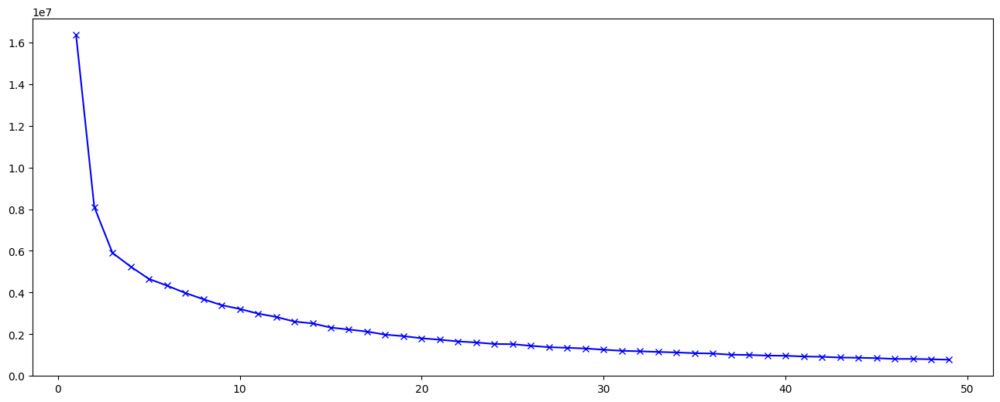

In [21]:
plt.figure(figsize=(16,6))
plt.plot(k,wcss,'bx-')
plt.show()

In [22]:
kmeans_model = KMeans(n_clusters=4).fit(pca_df)
pca_df1['Predicted_Clusters'] = kmeans_model.predict(pca_df)
print(pca_df1.Predicted_Clusters.value_counts())

Predicted_Clusters
0    1835
1    1232
2    1168
3     969
Name: count, dtype: int64


In [23]:
for i in range(4):
    print('cluster', i)
    print(pca_df1[pca_df1['Predicted_Clusters']==i]['Owner'].unique())

cluster 0
['aadithyajp' 'aburriyo' 'ahsan2002' 'aindilis' 'ajanthadevi2012'
 'ammarlodhi255' 'arasgungore' 'arun0008' 'asad70' 'asadullahpranto'
 'aurora' 'balajibala123' 'barakplasma' 'brettkromkamp' 'bugcy013'
 'cambricorp' 'capegreg' 'cumsoft' 'danielkobuszewski' 'deepfence'
 'deldersveld' 'delian' 'dhineshkumaradk868' 'diptangsu' 'durgeshsamariya'
 'ehsanmorgan' 'esin' 'exajobs' 'ferrerofranco' 'firmai' 'fundon'
 'furingleb' 'gamemann' 'gaudhami4' 'george0st' 'ginoemiliozzi'
 'gitmanujacob' 'gopiashokan' 'gsrarul' 'gurusura' 'hamidpy' 'hvn4k'
 'Sabiullah' 'Saim22Ahmed' 'SaraKhamisMostafa' 'Sathramlokesh' 'SenZmaKi'
 'Shantanu-Gupta-au16' 'SUKHMAN-SINGH-1612' 'Tamadermh' 'TGJAISAI'
 'Vatshayan' 'Vigneshwaran-93' 'VishalPande4449' 'Wahaj-Raza' 'Yashpal98'
 'Yousefuwk20' 'Zid95']
cluster 1
['furingleb' 'gitmanujacob' 'gurusura' 'hamidpy' 'hangel' 'hvn4k'
 'immangeek' 'imsanjoykb' 'inboxpraveen' 'intltechventures' 'itsgokulram'
 'jawnsy' 'jazzwang' 'jod431047' 'jorgeguberte' 'karanpk02

In [24]:
for i in range(4):
    print('cluster', i)
    print(pca_df1[pca_df1['Predicted_Clusters']==i]['Language_Used'].unique())

cluster 0
['CSS' 'Jupyter Notebook' 'Python' 'HTML' 'Java' 'JavaScript' 'Go' 'C++'
 'TypeScript' 'Emacs Lisp' 'Perl' 'Prolog' 'Perl 6' 'Common Lisp' 'Stata'
 'Shell' 'Makefile' 'C' 'TeX' 'R' 'Assembly' 'Kotlin' 'C#' 'Promela'
 'VHDL' 'MATLAB' 'Dart' 'Swift' 'Blade' 'PHP' 'Ruby' 'Nimrod' 'Erlang'
 'Nim' 'ooc' 'Rust' 'VimL' 'HCL' 'Vue' 'Dockerfile' 'Nunjucks' 'Nix'
 'reStructuredText' 'Vala' 'Scheme' 'XML' 'Elixir' 'Elm' 'ApacheConf'
 'CoffeeScript' 'Smarty' 'Scala' 'Pony' 'Batchfile' 'YARA' 'Matlab'
 'PLpgSQL' 'PowerShell' 'Arduino' 'Roff' 'TSQL' 'MDX' 'Zig' 'SCSS'
 'Game Maker Language' 'Lua' 'SourcePawn' 'GDScript' 'Haskell'
 'Objective-C' 'Solidity' 'Pug']
cluster 1
['Svelte' 'Jupyter Notebook' 'C++' 'Python' 'C#' 'JavaScript' 'SCSS' 'C'
 'HTML' 'Java' 'Dart' 'Cuda' 'MATLAB' 'R' 'CSS' 'Makefile' 'Shell' 'Perl'
 'Dockerfile' 'Go' 'Scala' 'Ruby' 'PowerShell' 'Arduino' 'EJS' 'PHP'
 'Smarty' 'TypeScript' 'TeX' 'CMake' 'M' 'Roff' 'Rust' 'CoffeeScript'
 'Kotlin' 'Solidity' 'Batchfile' 'Vue

# Classification

In [25]:
pca_df1

,Compnent_1,Compnent_2,Owner,Language_Used,Predicted_Clusters
0,11.430879,22.691963,1476Ram,Jupyter Notebook,2
1,17.565336,21.950912,1476Ram,Jupyter Notebook,2
2,11.005224,22.164154,1476Ram,Jupyter Notebook,2
3,-20.674141,24.448362,1476Ram,Jupyter Notebook,2
4,14.803958,-7.341488,1476Ram,Jupyter Notebook,2
...,...,...,...,...,...
5199,4.465373,-4.442339,zhouyunnudt,Python,1
5200,-22.900511,-13.953099,zhouyunnudt,Python,3
5201,-22.113258,3.663233,zhouyunnudt,Java,3
5202,12.178292,-12.106674,Zid95,CSS,0


In [26]:
df3 = pca_df1.copy()
df3[['Commits', 'Stargazers', 'Forks_Count','Is_Fork']] =df[['Commits', 'Stargazers', 'Forks_Count','Is_Fork']]
final_df = df3.copy()
df3.head()

,Compnent_1,Compnent_2,Owner,Language_Used,Predicted_Clusters,Commits,Stargazers,Forks_Count,Is_Fork
0,11.430879,22.691963,1476Ram,Jupyter Notebook,2,4,0,0,0
1,17.565336,21.950912,1476Ram,Jupyter Notebook,2,2,0,0,0
2,11.005224,22.164154,1476Ram,Jupyter Notebook,2,2,0,0,0
3,-20.674141,24.448362,1476Ram,Jupyter Notebook,2,8,0,0,0
4,14.803958,-7.341488,1476Ram,Jupyter Notebook,2,2,0,0,0


In [57]:
# Here Storing the dataframe into csv file for Cluster Reference
final_df.to_csv(r'src/repo_clusters.csv', index = False)

In [27]:
# Dictionary to store unique values before and after ordinal encoding

column_names = ['Owner', 'Language_Used']
unique_value ={}
for col_name in column_names:
    data = df3[col_name].unique()
    data.sort()

    df3[col_name] = enc.fit_transform(df3[[col_name]])

    globals()[col_name] = {}
    for i in df3[col_name].unique():
        globals()[col_name][data[int(i)]] = i
        unique_value[f'{col_name}'] = globals()[col_name]
    # print(globals()[col_name])
unique_value

{'Owner': {'1476Ram': 0.0,
  'aadithyajp': 73.0,
  'Aathityan-K': 2.0,
  'AbdullahBakir97': 3.0,
  'Abdulrahmankhaled11': 4.0,
  'aburriyo': 74.0,
  'ahsan2002': 75.0,
  'aindilis': 76.0,
  'ajanthadevi2012': 77.0,
  'AkhlaqShaikh1': 5.0,
  'Alex-Lekov': 6.0,
  'AlvaroIsrael': 7.0,
  'ammarlodhi255': 78.0,
  'AQSAMOHSIN': 1.0,
  'arasgungore': 79.0,
  'ArchanaDeveloper': 8.0,
  'Arivoli7': 9.0,
  'ArqamKhursheed': 10.0,
  'arun0008': 80.0,
  'Asad-devv': 11.0,
  'asad70': 81.0,
  'asadullahpranto': 82.0,
  'aurora': 83.0,
  'balajibala123': 84.0,
  'barakplasma': 85.0,
  'brettkromkamp': 86.0,
  'bugcy013': 87.0,
  'cambricorp': 88.0,
  'capegreg': 89.0,
  'Cherry63': 12.0,
  'Coding-with-Adam': 13.0,
  'cumsoft': 90.0,
  'danielkobuszewski': 91.0,
  'deepfence': 92.0,
  'Deepikarukmani': 14.0,
  'deldersveld': 93.0,
  'delian': 94.0,
  'DevEssaAhmed': 15.0,
  'dhineshkumaradk868': 95.0,
  'diptangsu': 96.0,
  'durgeshsamariya': 97.0,
  'Easemlojog': 16.0,
  'ehsanmorgan': 98.0,
  'Eli

In [62]:
import json
# Write the unique_value dictionary to a JSON file with proper indentation
with open('src/Category_Columns_Encoded_Data.json', 'w') as file:
    json.dump(unique_value, file , indent = 4)

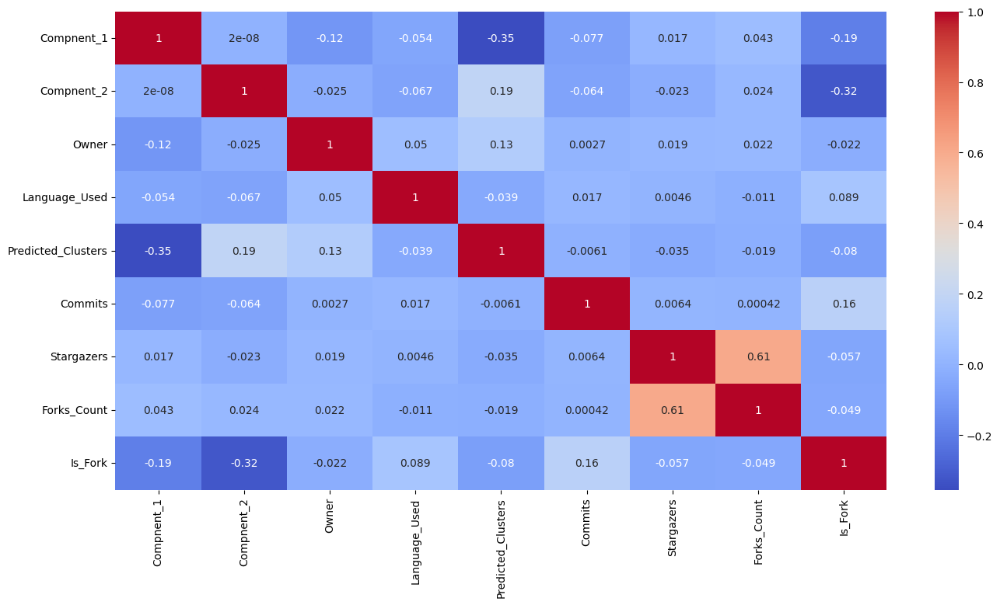

In [28]:
plt.figure(figsize = (16, 8))
sns.heatmap(df3.corr(), annot = True, cmap='coolwarm')
plt.show()

In [29]:
class classification:

    def __init__(self, x, y):
        self.models =[("AdaBoostClassifier", AdaBoostClassifier()),
                      ("RandomForestClassifier", RandomForestClassifier()),
                      ("ExtraTreesClassifier", ExtraTreesClassifier()),
                      ("BaggingClassifier", BaggingClassifier()),
                      ("ExtraTreeClassifier", ExtraTreeClassifier()),
                      ("DecisionTreeClassifier", DecisionTreeClassifier()),
                      ("XGBClassifier", XGBClassifier()),
                      ("KNeighborsClassifier", KNeighborsClassifier()),
                      ("LGBMClassifier", LGBMClassifier()),
                      ("RidgeClassifier", RidgeClassifier()),

                     ]
        self.x_train, self.x_test, self.y_train,self.y_test = train_test_split(x, y,test_size=0.2, random_state = 42)

    def all_model(self):
        # Train and evaluate each model
        print(self.x_train.shape, self.x_test.shape, self.y_train.shape, self.y_test.shape)
        result = []
        for model_name, model in self.models:
            model.fit(self.x_train, self.y_train)
            y_test_pred = model.predict(self.x_test)
            y_train_pred = model.predict(self.x_train)

            data ={'Model_Name': model_name,
                    'Train_Accuracy': round(accuracy_score(self.y_train, y_train_pred),6),
                    'Test_Accuracy': round(accuracy_score(self.y_test, y_test_pred),4),
                    'Train_Balance_Accuracy': round(balanced_accuracy_score(self.y_train, y_train_pred),6),
                    'Test_Balance_Accuracy': round(balanced_accuracy_score(self.y_test, y_test_pred),4),
                    # 'Train_F1_Score': round(f1_score(self.y_train, y_train_pred),6),
                    # 'Test_F1_Score': round(f1_score(self.y_test, y_test_pred),4),
                    # 'Train_ROC_AUC': round(roc_auc_score(self.y_train, y_train_pred),6),
                    # 'Test_ROC_AUC': round(roc_auc_score(self.y_test, y_test_pred),4),
                    }
            result.append(data)
            
        self.model_accuracy_df = pd.DataFrame(result)

        return self.model_accuracy_df

In [30]:
# Define target variable 'y' and features 'x'
y = df3['Predicted_Clusters']
x = df3.drop('Predicted_Clusters', axis =1)

In [40]:
# Instantiate the classification_models object
classification_models = classification(x,y)
# Train and evaluate classification models
models = classification_models.all_model()
models

(4163, 8) (1041, 8) (4163,) (1041,)
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003852 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1142
[LightGBM] [Info] Number of data points in the train set: 4163, number of used features: 8
[LightGBM] [Info] Start training from score -1.056053
[LightGBM] [Info] Start training from score -1.447460
[LightGBM] [Info] Start training from score -1.473328
[LightGBM] [Info] Start training from score -1.672137
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] N

,Model_Name,Train_Accuracy,Test_Accuracy,Train_Balance_Accuracy,Test_Balance_Accuracy
0,AdaBoostClassifier,0.795820,0.8127,0.776000,0.7723
1,RandomForestClassifier,1.000000,0.9933,1.000000,0.9931
2,ExtraTreesClassifier,1.000000,0.9933,1.000000,0.9926
3,BaggingClassifier,0.999520,0.9942,0.999489,0.9934
4,ExtraTreeClassifier,1.000000,0.9366,1.000000,0.9396
5,DecisionTreeClassifier,1.000000,0.9942,1.000000,0.9934
6,XGBClassifier,1.000000,0.9923,1.000000,0.9914
7,KNeighborsClassifier,0.972856,0.9491,0.971004,0.9413
8,LGBMClassifier,1.000000,0.9923,1.000000,0.9914
9,RidgeClassifier,0.838098,0.8386,0.875897,0.8816


In [41]:

# Extract x_train, x_test, y_train, y_test from classification_models
x_train, x_test, y_train, y_test = classification_models.x_train, classification_models.x_test, classification_models.y_train, classification_models.y_test
x_train.shape, x_test.shape, y_train.shape, y_test.shape

((4163, 8), (1041, 8), (4163,), (1041,))

In [75]:
# Fit an KNeighborsClassifier model to the training set
model = KNeighborsClassifier().fit(x_train, y_train)
y_pred= model.predict(x_test)
accuracy_score(y_test, y_pred)

0.9490874159462056

In [76]:

# Define the KNeighborsClassifier
knn_classifier = KNeighborsClassifier()

# Define the hyperparameters to tune
param_grid = {
    'n_neighbors': [3, 5, 7],
    'weights': ['uniform', 'distance'],
    'algorithm': ['auto', 'ball_tree', 'kd_tree', 'brute'],
    'leaf_size': [10, 20, 30],
    'p': [1, 2],
}

# Perform grid search
grid_search = GridSearchCV(knn_classifier, param_grid, cv=5)
grid_search.fit(x_train, y_train)

# Print the best hyperparameters
print("Best Hyperparameters:", grid_search.best_params_)

# Evaluate the model on the test set
accuracy = grid_search.best_estimator_.score(x_test, y_test)
print("Test Accuracy:", accuracy)

Best Hyperparameters: {'algorithm': 'auto', 'leaf_size': 10, 'n_neighbors': 5, 'p': 1, 'weights': 'distance'}
Test Accuracy: 0.9500480307396734


In [79]:
knn_classifier = KNeighborsClassifier(algorithm = 'auto', 
                                      leaf_size = 10,
                                      n_neighbors = 5, 
                                      p = 1, 
                                      weights = 'distance')
knn_classifier.fit(x_train, y_train)
y_pred= knn_classifier.predict(x_test)

accuracy_score(y_test, y_pred)

0.9500480307396734

In [80]:
from sklearn.metrics import confusion_matrix, classification_report
# Create a confusion matrix
cm_df = pd.DataFrame(confusion_matrix(y_test, y_pred))
cm_df.columns=[f'Predicted Clusters {i}' for i in [0, 1, 2, 3]]
cm_df=cm_df.rename(index={i:f'Actual Clusters {i}' for i in df3['Predicted_Clusters'].unique()})
# Calculate accuracy manually
accuracy = 0
for i in range(cm_df.shape[0]):
  accuracy += cm_df.iloc[i,i]
accuracy = accuracy / cm_df.sum().sum()
print(accuracy)
cm_df

0.9500480307396734


,Predicted Clusters 0,Predicted Clusters 1,Predicted Clusters 2,Predicted Clusters 3
Actual Clusters 0,376,2,2,7
Actual Clusters 1,7,239,0,7
Actual Clusters 2,7,1,206,0
Actual Clusters 3,14,5,0,168


In [81]:
print(classification_report(y_test, y_pred,))

              precision    recall  f1-score   support

           0       0.93      0.97      0.95       387
           1       0.97      0.94      0.96       253
           2       0.99      0.96      0.98       214
           3       0.92      0.90      0.91       187

    accuracy                           0.95      1041
   macro avg       0.95      0.94      0.95      1041
weighted avg       0.95      0.95      0.95      1041



In [73]:
username='Prakash-Kani'

testdata = df3[df3['Owner']== unique_value['Owner'][username]]

testdata

,Compnent_1,Compnent_2,Owner,Language_Used,Predicted_Clusters,Commits,Stargazers,Forks_Count,Is_Fork
4314,11.666443,22.813107,49.0,61.0,2,21,0,0,0
4315,23.507998,21.959833,49.0,61.0,2,18,0,0,0
4316,23.334414,21.886003,49.0,35.0,2,19,0,0,0
4317,19.751183,21.985281,49.0,35.0,2,19,0,0,0
4318,19.953890,22.043179,49.0,61.0,2,12,0,0,0
4319,23.050859,21.926659,49.0,35.0,2,18,0,0,0
4320,19.591909,22.209822,49.0,35.0,2,25,0,0,0
4321,21.442204,21.947638,49.0,35.0,2,17,0,0,0
4322,-20.674141,24.448362,49.0,61.0,2,10,0,0,0


In [82]:
pred =knn_classifier.predict(testdata.drop('Predicted_Clusters', axis =1))
pred

array([2, 2, 2, 2, 2, 2, 2, 2, 2])

In [87]:
# Save the KNeighborsClassifier model to a pickle file


with open(r'src/Cluster_Classifying_Model.pkl', 'wb') as file:
    pickle.dump(knn_classifier, file) 

In [88]:
with open(r'src/Cluster_Classifying_Model.pkl', 'rb') as file:
    model = pickle.load(file)

In [89]:
model.predict(testdata.drop('Predicted_Clusters', axis = 1))

array([2, 2, 2, 2, 2, 2, 2, 2, 2])

In [51]:
unique_value_ref ={i[1]:i[0] for i in unique_value['Owner'].items()}
unique_value_ref[49]

'Prakash-Kani'

# Top 10 Users Recommendation Using Cosine Similarity

In [84]:
def Yet_to_pred(username):

   test_user = df3[df3['Owner']==unique_value['Owner'][username]]
   pred =knn_classifier.predict(test_user.drop('Predicted_Clusters', axis =1))
   pred = pd.Series(pred)

   user_data = repo1[repo1['Owner']== username][['Repo_Name', 'Description', 'Owner' ]]

   cluster_index = [ind for ind in df3[df3['Predicted_Clusters']==pred.value_counts().index[0]].index]
   cluster_details = repo1.iloc[cluster_index][['Repo_Name', 'Description', 'Owner' ]]
   cluster_details.reset_index(drop= True, inplace = True)
   user_index = cluster_details[cluster_details['Owner']==username].index


   # nlp = spacy.load('en_core_web_md')

   repo_doc = [nlp(i) for i in cluster_details['Repo_Name']]
   description_doc = [nlp(i) for i in cluster_details['Description']]

   repo_vector = [token.vector for token in repo_doc]
   description_vector = [token.vector for token in description_doc]

   
   repo_df = pd.DataFrame(repo_vector)

   repo_df.columns =['repo_vector_' + str(i) for i in repo_df.columns]

   # Create a DataFrame with the description vectors
   description_df = pd.DataFrame(description_vector)
   description_df.columns = ['description_vector_' + str(i) for i in description_df.columns]
   # Merge the two DataFrames into one
   df1 = pd.merge(repo_df, description_df, left_index=True, right_index=True)
   df1['Owner'] = cluster_details['Owner']
   return user_index, cluster_details, df1
# Yet_to_pred('Prakash-Kani')


In [90]:
from sklearn.metrics.pairwise import cosine_similarity
def get_similarity(username):
    
    user_indices, cluster_details, df = Yet_to_pred(username)

    enc = OrdinalEncoder()
    df['Owner'] = enc.fit_transform(df[['Owner']])

    similarity_matrix = cosine_similarity(df)

    user_similarity_scores = similarity_matrix[user_indices].mean(axis=0)

    # Create a DataFrame with owner indices and their similarity scores
    similarity_df = pd.DataFrame({'Owner': df['Owner'], 'Similarity': user_similarity_scores})

    # Sort the DataFrame by similarity scores in descending order
    sorted_similarity_df = similarity_df.sort_values(by='Similarity', ascending=False)

    # Exclude the user's own indices
    sorted_similarity_df = sorted_similarity_df[sorted_similarity_df['Owner']!= unique_value['Owner'][username]]

    top_10_recommendations = sorted_similarity_df.head(10)

    print('Distinct top10 User') 
    # print(sorted_similarity_df.Owner.unique()[:10])
    # print({owner :unique_value_ref[owner] for owner in sorted_similarity_df.Owner.unique()[:10]})

    # Display the recommendations
    return{owner :unique_value_ref[owner] for owner in sorted_similarity_df.Owner.unique()[:10]}


In [91]:
get_similarity('Prakash-Kani')

Distinct top10 User


{52.0: 'Ranga12891',
 51.0: 'Pythondeveloper6',
 55.0: 'SHIRSENDU-KONER',
 62.0: 'SenZmaKi',
 53.0: 'RavindrapalRathore',
 38.0: 'MohammedSarhan3',
 58.0: 'Sabiullah',
 46.0: 'OsamaAlmamri',
 57.0: 'SUKHMAN-SINGH-1612',
 40.0: 'Muhammad-Jawwad'}